#### Import necessary packages

In [502]:


import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import os
import pandas_profiling

pd.set_option('display.max_columns',None)


from sklearn.model_selection import train_test_split


from sklearn.preprocessing import LabelEncoder

from scipy.stats import zscore

from sklearn.decomposition import PCA

from sklearn.svm import SVC

from sklearn.model_selection import GridSearchCV

from sklearn import metrics

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


### Listing and evaluating each file

In [503]:

for f in os.listdir():
    print(f.ljust(30) +"--" + str(round(os.path.getsize(f) / 1000000, 2)) + 'MB')

.ipynb_checkpoints            --0.0MB
Project_vehicleClassification.html--13.44MB
Project_vehicleClassification.ipynb--13.11MB
Unsupervised Learning problem statement.pdf--0.61MB
vehicle.csv                   --0.06MB


In [504]:
#No Additional files present apart from data set

### Importing csv to data frame

In [505]:

df=pd.read_csv('vehicle.csv')
df.shape

(846, 19)

In [506]:
#contains 864 rows and 19 columns
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [507]:
df.tail()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


- Values looks distributed at first glance
-  18 independent variables (compactness, circularity, distance_circularity, radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scatter_ratio, elongatedness, pr.axis_rectangularity, max.length_rectangularity, scaled_variance, scaled_variance.1, scaled_radius_of_gyration, scaled_radius_of_gyration.1, skewness_about, skewness_about.1, skewness_about.2, hollows_ratio) and one dependent variable (class).
- All columns are numeric except dependent column 'class'

### Exploring Data

In [508]:
#Intial look on table columns and types and non null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr


- Total Columns: 19
- Target column: class (object Dtype) - contains details on cars/vans/bus
- 14- float field and 4 int fields
- total 846 rows
- few null entries on multiple fields - need to identify the pattern and fix it
- No special charcters in numeric fields else we migh have noticed other dtypes.


In [509]:
#understading the data
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
compactness,846,NaN,NaN,NaN,93.6785,8.23447,73,87,93,100,119
circularity,841,NaN,NaN,NaN,44.8288,6.15217,33,40,44,49,59
distance_circularity,842,NaN,NaN,NaN,82.1105,15.7783,40,70,80,98,112
radius_ratio,840,NaN,NaN,NaN,168.888,33.5202,104,141,167,195,333
pr.axis_aspect_ratio,844,NaN,NaN,NaN,61.6789,7.89146,47,57,61,65,138
max.length_aspect_ratio,846,NaN,NaN,NaN,8.56738,4.60122,2,7,8,10,55
scatter_ratio,845,NaN,NaN,NaN,168.902,33.2148,112,147,157,198,265
elongatedness,845,NaN,NaN,NaN,40.9337,7.81619,26,33,43,46,61
pr.axis_rectangularity,843,NaN,NaN,NaN,20.5824,2.59293,17,19,20,23,29
max.length_rectangularity,846,NaN,NaN,NaN,147.999,14.5157,118,137,146,159,188


- Class has 3 categories and max freq is 429
- numeric fields have huge variation from field to field, need to standardize the data for better outcomes
- mean and median are close by for majority of the fields hints the fields are close to normal distributions

### Null Value Analysis & Treatment

In [510]:
#identifying null values
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

- Multiple Null values found on the data set
- We didnt find any column to be any other format apart from Int or float, which suggests there are possibly no un related symbols or texts in the data set

In [511]:
#replace null values as nan
df = df.replace(' ', np.nan)

In [512]:
#Replacing the missing values by median
# median are more robust towards the data distribution compared to mean hence selected median for replacement
for i in df.columns[:17]:
    median_value = df[i].median()
    df[i] = df[i].fillna(median_value)

In [513]:
df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [514]:
#revalidating info - for post changes details
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  846 non-null    float64
 2   distance_circularity         846 non-null    float64
 3   radius_ratio                 846 non-null    float64
 4   pr.axis_aspect_ratio         846 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                846 non-null    float64
 7   elongatedness                846 non-null    float64
 8   pr.axis_rectangularity       846 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              846 non-null    float64
 11  scaled_variance.1            846 non-null    float64
 12  scaled_radius_of_gyration    846 non-null    float64
 13  scaled_radius_of_gyr

- Rechecking info, all columns has same number of non-null count

### Outlier Analysis & Treatment

<AxesSubplot:>

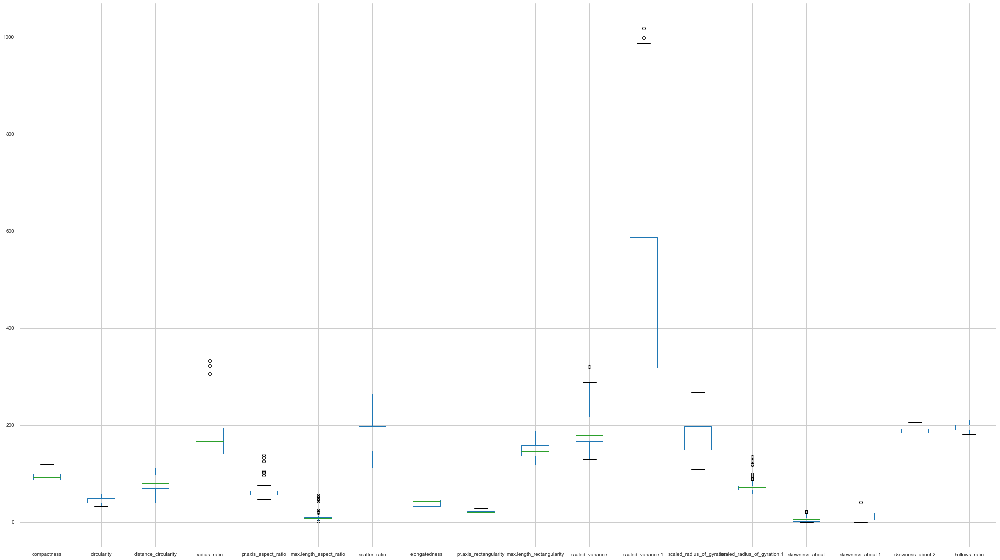

In [515]:
#understanding outliers
df.boxplot(figsize=(35,20))

- Multiple outliers were present in the cols such as - radius_ratio,pr_axis_aspect_ratio etc
- Will treat the outliers with replacing it with medians/max boundry value ( IQR * 1.5), we might miss-represent few data points for outliers but our main goal is to generalize the model for better overall prediction. 
- Clustering techniques are hihgly volatile towards outliers and need treatment.
- We might observe new outliers once we treat the data as values will be updated and new IQR will be formed, but we will treat the data set only once with it.

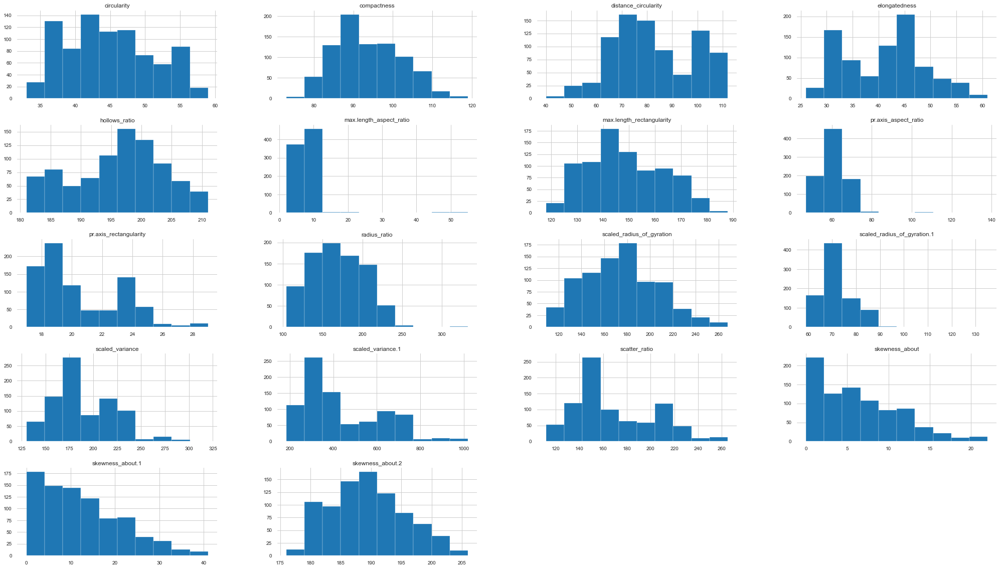

In [516]:
#understanding distribution before the outlier treatment
df.hist(figsize=(35,20));

- as observed in box plot, we can clearly see many columns has long tails in histogram as well
- Majority of the columns data are distributed but having multiple peaks

#### Outlier Treatment


- we will be treating the columns with same logic used in box plot using IQR
- We are replacing the Outliers with boundry values to keep the higer values colse to higher and lower boundries.
- Goal is to keep the value inside acceptable ranges without loosing its main charatcteristic of being outlier or being a higher/lower number. Using this approach we will slightly increase the frequency on boundry values but they will be inside range.
- Replacing with Mean or median might miss represent the main characteristics of the data set which is pushing it to be be outlier.

In [517]:
#- selecting all but leaving out the last columns whihc is our target
for cols in df.columns[:-1]:
    q1=df[cols].quantile(0.25)
    q3=df[cols].quantile(0.75)
    iqr=q3-q1
    
    low=q1-1.5*iqr
    high=q3+1.5*iqr
    
    df.loc[(df[cols]<low),cols]=low
    df.loc[(df[cols]>high),cols]=high

<AxesSubplot:>

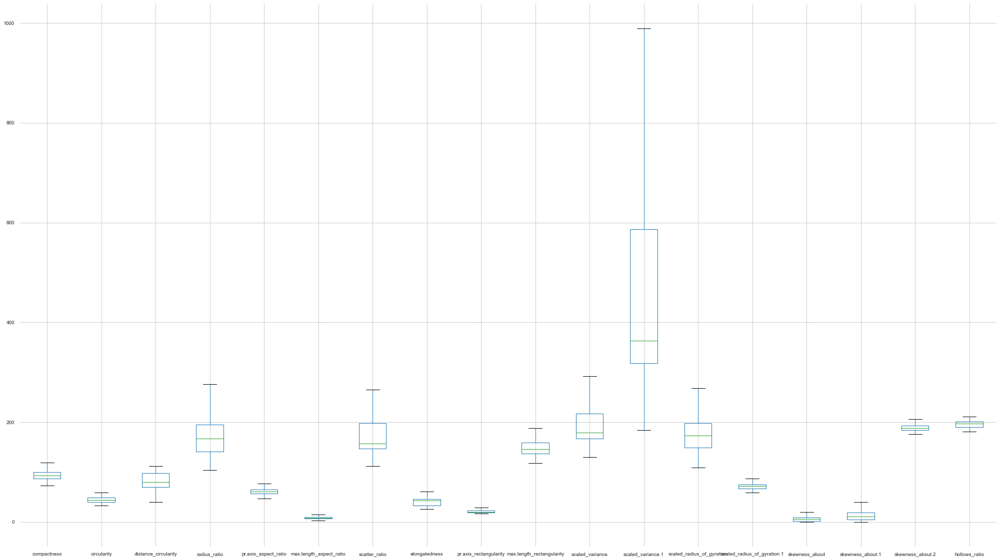

In [518]:
#reevaluate the box plot for outliers
df.boxplot(figsize=(35,20))

- we can notice exisitng outliers were gone but fortunately no new new outliers were imerged in any columns

### Understanding the Attributes

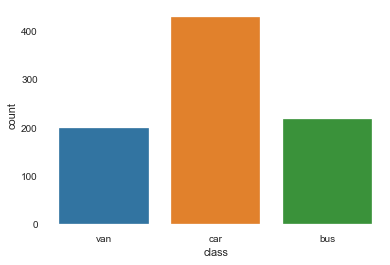

car    429
bus    218
van    199
Name: class, dtype: int64


In [519]:
#understanding Dependent column
sns.countplot(df['class']);
plt.show()
print(df['class'].value_counts())

- Majority of the data set is having cars (429) followed by bus (218) and van (199)

In [520]:
#have to use label encoding for class to get a view on correlation
#using labelencoder and not one hot encoding for not increasing classes at this point
from sklearn.preprocessing import LabelEncoder
lblEncoder=LabelEncoder()
df['class']=lblEncoder.fit_transform(df['class'])

In [521]:
cor_df=df.corr()

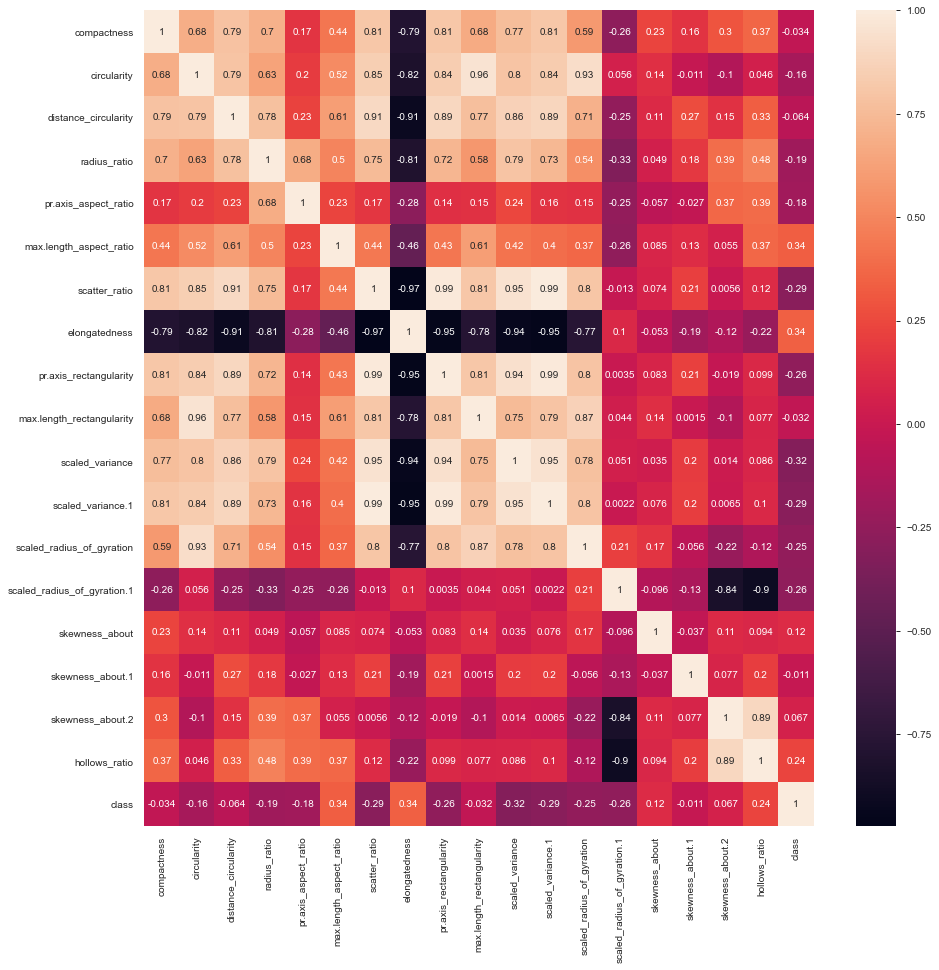

In [522]:
fig,ax=plt.subplots(figsize=(15,15));
sns.heatmap(cor_df,annot=True);

- Class columns doesnt have very high correlation with any of the columns
- On the other hand elongatednes has very high correlation with multiple columns, we can plan for it to be removed to reduce multicoliniarity.
- There are multiple columns which have high correlation with other columns like circularity with max.length_rectangularity & scaled_radius of gyration, scatter_ratio with scaled_variance.1
- We can identify columns which has less correlation with class col and plan it for removal down the line.

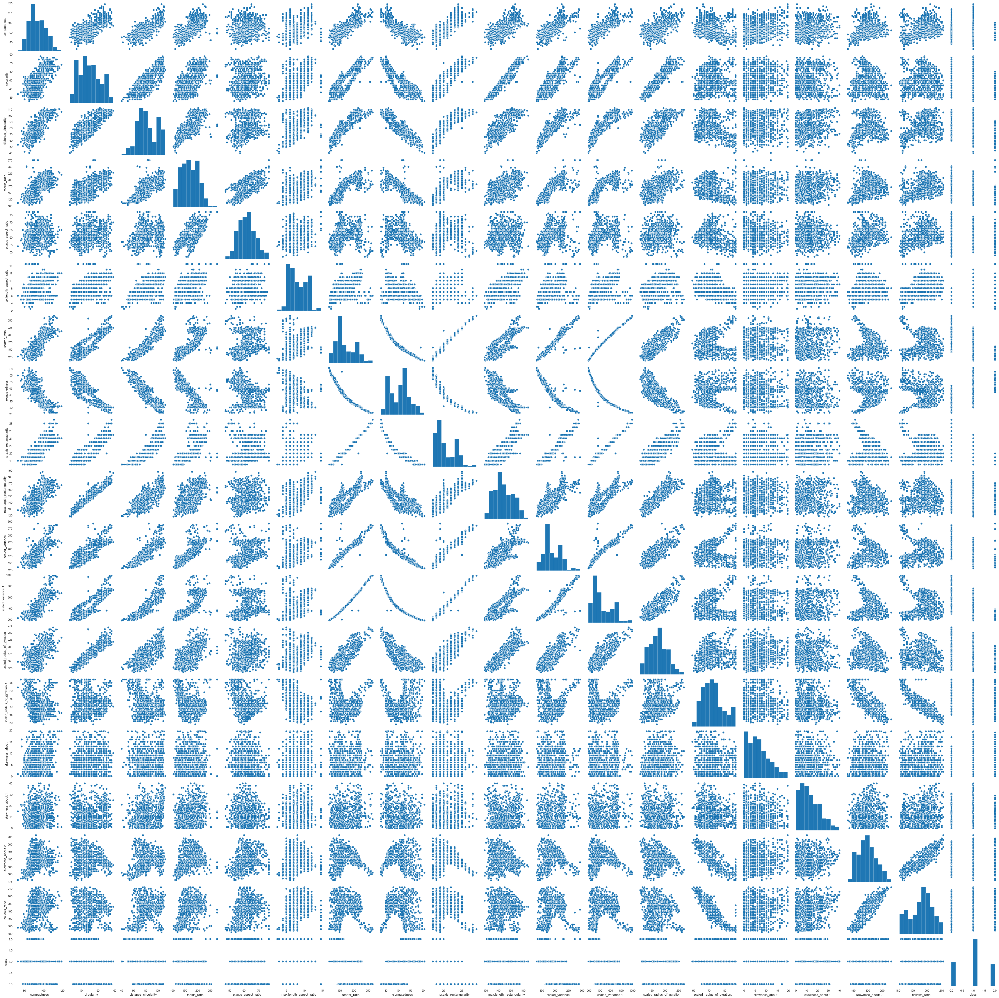

In [523]:
#Viewing all details
sns.pairplot(df)

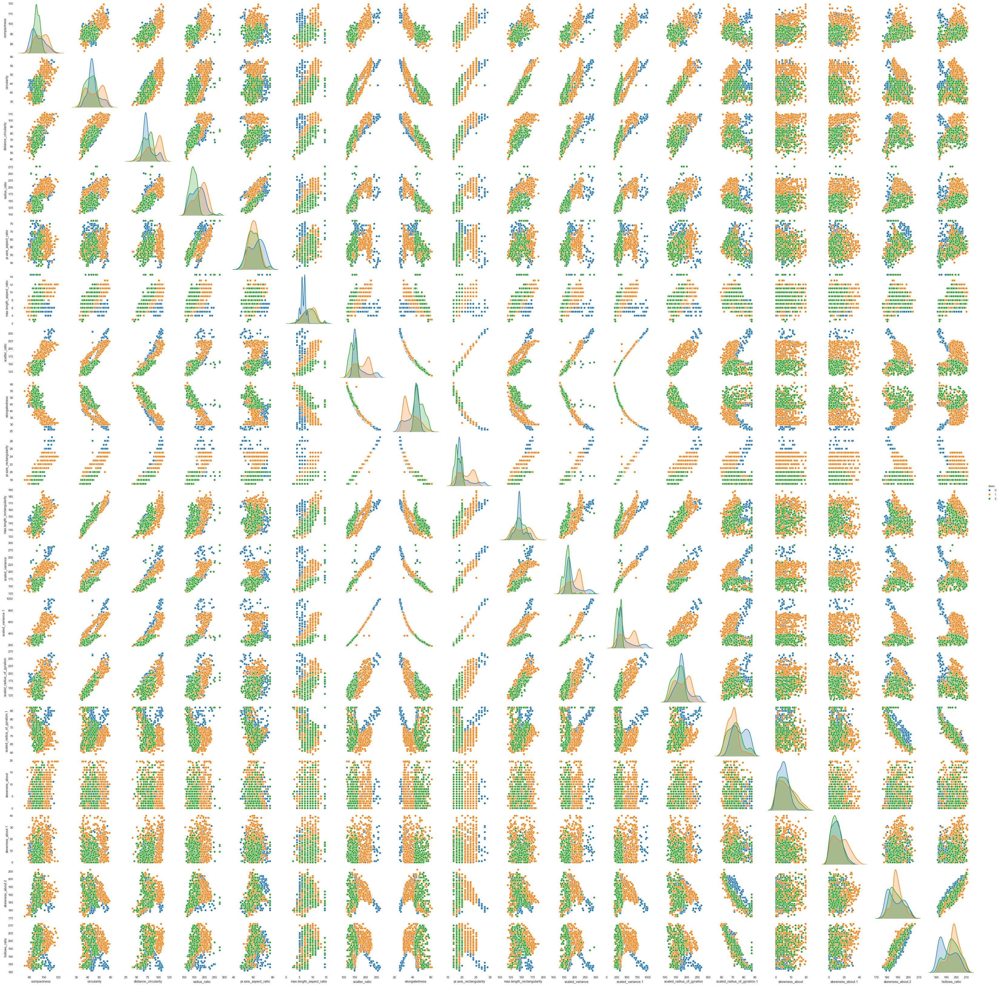

In [524]:
#viewing with class distribution on each graph
sns.pairplot(df, hue='class')

- As captured during correlation heat map, we can observe multiple columns has strong +/- linear relation with other columns
- We can notice the linear lineas forming for columns like like circularity with max.length_rectangularity & scaled_radius of gyration, scatter_ratio with scaled_variance.1
- There are several variables that are highly correlated with each other
- Most of the graphs were we can see a +/- linear relation, we can notice the groups are clearly identifiable
- There are multiple graphs where we can notice the class distribution is clouded and making a random cloud pattern such as - compactness, distance_circularity, skewness_about.1, skewness_about.2, etc. From Correlation heat map also we can notice these are contributing very less linear relation.

In [525]:
df.corr()['class'].sort_values()

scaled_variance               -0.315733
scatter_ratio                 -0.288895
scaled_variance.1             -0.287997
pr.axis_rectangularity        -0.258481
scaled_radius_of_gyration.1   -0.256383
scaled_radius_of_gyration     -0.250267
radius_ratio                  -0.192635
pr.axis_aspect_ratio          -0.182524
circularity                   -0.158910
distance_circularity          -0.064467
compactness                   -0.033796
max.length_rectangularity     -0.032399
skewness_about.1              -0.010689
skewness_about.2               0.067244
skewness_about                 0.121044
hollows_ratio                  0.235874
max.length_aspect_ratio        0.337151
elongatedness                  0.339344
class                          1.000000
Name: class, dtype: float64

- Correlation details with Class we can notice how few columns linear relation are less than +/- 0.1.
- We can plan to remove the columns in middle which are providing less then 0.1 linear relation for pridicting class.
- Along with that we can remove elongatedness as well, which has high correlation with multipl columns (above 0.9).

In [526]:
#we will test with all columns first to see the model performance and later test with data set with selective columns

In [527]:
df.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

### Split Data into train and Test

In [528]:
# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
X = df.iloc[:,0:17].values
y = df.iloc[:,18].values

In [529]:
#splitting the data in test and train sets
#from sklearn.model_selection import train_test_split train:test being 80:20
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 10)

In [530]:
# scaling the data using the standard scaler as SVC is highly dependent on scale of columns
#from sklearn.preprocessing import StandardScaler
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

### Model Creation

In [531]:
#Support vector Classifier
modelComp=pd.DataFrame()

In [532]:
#from sklearn.svm import SVC
model = SVC(kernel='linear')

model.fit(X_train_sd, y_train)
prediction = model.predict(X_test_sd)

In [533]:
# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train_sd, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test_sd , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9511834319526628
Accuracy on Testing data:  0.9411764705882353
Recall value:  0.9390948660611582
Precision value:  0.9243578813911295
Confusion Matrix:
 [[42  1  3]
 [ 1 84  0]
 [ 1  4 34]]
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93        46
           1       0.94      0.99      0.97        85
           2       0.92      0.87      0.89        39

    accuracy                           0.94       170
   macro avg       0.94      0.92      0.93       170
weighted avg       0.94      0.94      0.94       170



- With all cols/dimensions we are getting Test accuracy of 94.12%, with close precission and recall values which are more than 90%.
- Training accuracy is similar to test accuracy so we can fairly assume the model is a good fit and not an overfit/underfit model.

### K Fold Cross Validaton

In [534]:
#Perform K fold cross validation

num_folds = 50
seed = 10

# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
#X = df.iloc[:,0:17].values
#y = df.iloc[:,18].values

# scaling the data using the standard scaler
#X_sd = StandardScaler().fit_transform(X)



#We done to do above step for reducing risk of any data leaks and we will be using existing train data which is already standardized

kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
#kfold = KFold(n_splits=num_folds)
model1 = SVC(kernel='linear')
results = cross_val_score(model1, X_train_sd, y_train, cv=kfold)
print(results)
print("\n Average model Accuracy: %.3f%% with std. dev - (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

modelComp=modelComp.append(pd.DataFrame({'Model':['SVC-All Cols'],
                                         'Accuracy':[model.score(X_test_sd , y_test)],
                                         'Precission':[metrics.precision_score(y_test, prediction, average='macro')],
                                         'Recall':[metrics.recall_score(y_test, prediction, average='macro')],
                                         'Kfold-Mean-Accuracy':[results.mean()],
                                         'Kfold-StdDeviation':[results.std()]}))

[0.92857143 1.         0.92857143 0.92857143 1.         0.92857143
 0.92857143 0.92857143 1.         1.         0.92857143 0.85714286
 0.92857143 0.92857143 1.         0.92857143 1.         1.
 1.         0.85714286 0.85714286 0.64285714 0.92857143 0.85714286
 0.92857143 0.78571429 1.         0.92307692 0.92307692 1.
 1.         0.92307692 1.         0.92307692 0.92307692 0.92307692
 0.92307692 1.         1.         0.92307692 0.92307692 0.92307692
 0.92307692 1.         1.         1.         0.84615385 0.92307692
 0.76923077 1.        ]

 Average model Accuracy: 93.385% with std. dev - (7.006%)


- Performing Cross Validation on trainig set only other wise it may lead to data leak issues if test data is exposed.
- Kfold mean accuracy is around 93.4% and we can see there are multiple occurances wehre model has acheived 100% as well.
- Min Accuracy observed was around 64%.

In [535]:
#Reducing Columns based on less correlation with dependent variable and high correlation with other columns (multi colliniarity)

In [536]:
#Checking model performance with reduced columns -  
#distance_circularity,compactness,max.length_rectangularity,skewness_about.1,elongatedness
#Dropping selective columns
from copy import deepcopy
df1=deepcopy(df)
df1=df1.drop(['distance_circularity','compactness','max.length_rectangularity','skewness_about.1','elongatedness'],axis=1)

# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
X = df1.iloc[:,0:12].values
y = df1.iloc[:,13].values

#splitting the data in test and train sets
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 10)

# scaling the data using the standard scaler
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

#Support vector Classifier

model = SVC(kernel='linear')

model.fit(X_train_sd, y_train)
prediction = model.predict(X_test_sd)

# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train_sd, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test_sd , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9334319526627219
Accuracy on Testing data:  0.9117647058823529
Recall value:  0.92180152573411
Precision value:  0.8912646379680026
Confusion Matrix:
 [[41  4  2]
 [ 1 79  0]
 [ 2  6 35]]
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.87      0.90        47
           1       0.89      0.99      0.93        80
           2       0.95      0.81      0.88        43

    accuracy                           0.91       170
   macro avg       0.92      0.89      0.90       170
weighted avg       0.91      0.91      0.91       170



- Training and test accuracy score are close by and above 90%, eve after dropping 5 columns.
- Precission adn Recall values were degraded sligtly from full data set

In [537]:
# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
#X = df1.iloc[:,0:12].values
#y = df1.iloc[:,13].values

# scaling the data using the standard scaler
#X_sd = StandardScaler().fit_transform(X)


kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
#kfold = KFold(n_splits=num_folds)
model1 = SVC(kernel='linear')
results = cross_val_score(model1, X_train_sd, y_train, cv=kfold)
print(results)
print("\n Average model Accuracy: %.3f%% with std. dev - (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

modelComp=modelComp.append(pd.DataFrame({'Model':['SVC-Selective Cols-13'],
                                         'Accuracy':[model.score(X_test_sd , y_test)],
                                         'Precission':[metrics.precision_score(y_test, prediction, average='macro')],
                                         'Recall':[metrics.recall_score(y_test, prediction, average='macro')],
                                         'Kfold-Mean-Accuracy':[results.mean()],
                                         'Kfold-StdDeviation':[results.std()]}))

[0.92857143 0.85714286 0.92857143 0.92857143 0.92857143 0.92857143
 0.92857143 0.92857143 0.85714286 1.         1.         0.92857143
 1.         0.92857143 0.92857143 0.85714286 1.         1.
 1.         0.85714286 0.92857143 0.71428571 0.85714286 0.85714286
 0.92857143 0.78571429 1.         0.84615385 0.76923077 1.
 1.         1.         1.         0.92307692 0.92307692 0.92307692
 0.92307692 0.92307692 1.         1.         1.         0.84615385
 0.84615385 1.         1.         0.92307692 0.92307692 0.84615385
 0.69230769 1.        ]

 Average model Accuracy: 92.187% with std. dev - (7.616%)


In [538]:
modelComp

,Model,Accuracy,Precission,Recall,Kfold-Mean-Accuracy,Kfold-StdDeviation
0,SVC-All Cols,0.941176,0.924358,0.939095,0.933846,0.070063
0,SVC-Selective Cols-13,0.911765,0.891265,0.921802,0.921868,0.076160


- Another attempt with not dropping elongatedness 

In [539]:
# Not Dropping elongatedness as it seems its making it loose crucial dtails
#Checking model performance with reduced columns -  
#distance_circularity,compactness,max.length_rectangularity,skewness_about.1

#Dropping selective columns
df1=deepcopy(df)
df1=df1.drop(['distance_circularity','compactness','max.length_rectangularity','skewness_about.1'],axis=1)

# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
X = df1.iloc[:,0:13].values
y = df1.iloc[:,14].values

#splitting the data in test and train sets
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 10)

# scaling the data using the standard scaler
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

#Support vector Classifier

model = SVC(kernel='linear')

model.fit(X_train_sd, y_train)
prediction = model.predict(X_test_sd)

# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train_sd, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test_sd , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.9378698224852071
Accuracy on Testing data:  0.9411764705882353
Recall value:  0.9496222473750565
Precision value:  0.9265688546999838
Confusion Matrix:
 [[42  1  1]
 [ 1 82  0]
 [ 1  6 36]]
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95        44
           1       0.92      0.99      0.95        83
           2       0.97      0.84      0.90        43

    accuracy                           0.94       170
   macro avg       0.95      0.93      0.94       170
weighted avg       0.94      0.94      0.94       170



 - we can clearly notice the Accuracy/Recall/Preceission is a lot more similar to testing whole data set, hence removing these variable is beneficial as its reducing the complexity and keeping the overll result at same levels.

In [540]:
#Perform K fold cross validation

In [541]:

# we separate the target variable (class) and save it in the y variable. Also the X contains the independant variables.
#X = df1.iloc[:,0:13].values
#y = df1.iloc[:,14].values

# scaling the data using the standard scaler
#X_sd = StandardScaler().fit_transform(X)



kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
#kfold = KFold(n_splits=num_folds)
model1 = SVC(kernel='linear')
results = cross_val_score(model1, X_train_sd, y_train, cv=kfold)
print(results)
print("\n Average model Accuracy: %.3f%% with std. dev - (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

modelComp=modelComp.append(pd.DataFrame({'Model':['SVC-Selective Cols-14'],
                                         'Accuracy':[model.score(X_test_sd , y_test)],
                                         'Precission':[metrics.precision_score(y_test, prediction, average='macro')],
                                         'Recall':[metrics.recall_score(y_test, prediction, average='macro')],
                                         'Kfold-Mean-Accuracy':[results.mean()],
                                         'Kfold-StdDeviation':[results.std()]}))

[1.         0.85714286 0.92857143 1.         1.         0.92857143
 0.92857143 0.92857143 0.92857143 1.         1.         0.78571429
 1.         0.92857143 0.92857143 0.92857143 1.         1.
 1.         0.85714286 0.92857143 0.64285714 0.92857143 0.85714286
 0.92857143 0.78571429 1.         0.92307692 0.84615385 1.
 1.         1.         1.         1.         0.92307692 0.92307692
 1.         0.84615385 1.         0.92307692 0.92307692 0.84615385
 0.84615385 1.         1.         0.92307692 0.84615385 0.92307692
 0.76923077 1.        ]

 Average model Accuracy: 92.923% with std. dev - (7.737%)


In [542]:
modelComp

,Model,Accuracy,Precission,Recall,Kfold-Mean-Accuracy,Kfold-StdDeviation
0,SVC-All Cols,0.941176,0.924358,0.939095,0.933846,0.070063
0,SVC-Selective Cols-13,0.911765,0.891265,0.921802,0.921868,0.076160
0,SVC-Selective Cols-14,0.941176,0.926569,0.949622,0.929231,0.077374


- From above 3 model comparisons, we can notice with dropping 4 cols which has very less correlationw ith dependent class is having very no difference in Accuracy/Precession/Recall and very less impact on Kfold-Mean accuracy as well.
- But considering the other model where we dropped 5 cols there is slight degradation in all fields.
- We are proceeding with dropping 5 columns as its reducing the dimensionality and mulitcolliniarity among the data set with very less or acceptable degradation.

In [543]:
#Setting df1 for 13 columns
df1=deepcopy(df)
df1=df1.drop(['distance_circularity','compactness','max.length_rectangularity','skewness_about.1','elongatedness'],axis=1)

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   circularity                  846 non-null    float64
 1   radius_ratio                 846 non-null    float64
 2   pr.axis_aspect_ratio         846 non-null    float64
 3   max.length_aspect_ratio      846 non-null    float64
 4   scatter_ratio                846 non-null    float64
 5   pr.axis_rectangularity       846 non-null    float64
 6   scaled_variance              846 non-null    float64
 7   scaled_variance.1            846 non-null    float64
 8   scaled_radius_of_gyration    846 non-null    float64
 9   scaled_radius_of_gyration.1  846 non-null    float64
 10  skewness_about               846 non-null    float64
 11  skewness_about.2             846 non-null    float64
 12  hollows_ratio                846 non-null    float64
 13  class               

### PCA - Implemation

In [544]:
#Applying PCA on whole data set compared first
X = df.iloc[:,0:17].values
y = df.iloc[:,18].values

# Scaling the independent attributes using standard Scaler
X_sd = StandardScaler().fit_transform(X)



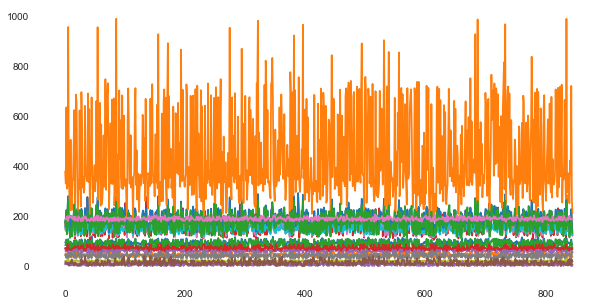

In [545]:

# prior to scaling
plt.rcParams['figure.figsize']=(10,5)
plt.plot(X)
plt.show()

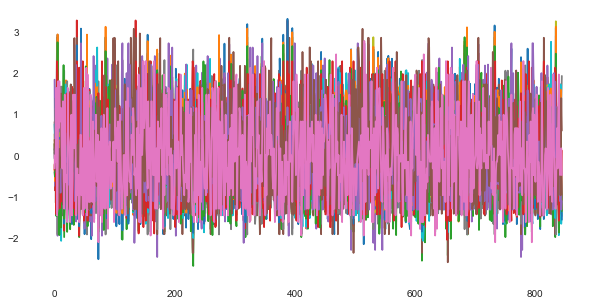

In [546]:
plt.rcParams['figure.figsize']=(10,5)
plt.plot(X_sd)
plt.show()

- We can notice the change in range of the values, all the values are nor close and within: +/- 3

In [547]:
# generating the covariance matrix and the eigen values for the PCA analysis
cov_matrix = np.cov(X_sd.T) # the relevanat covariance matrix
print('Covariance Matrix \n%s', cov_matrix)

#generating the eigen values and the eigen vectors
e_vals, e_vecs = np.linalg.eig(cov_matrix)
print('Eigenvectors \n%s' %e_vecs)
print('\nEigenvalues \n%s' %e_vals)

Covariance Matrix 
%s [[ 1.00118343  0.68569786  0.79086299  0.70501074  0.16710246  0.437849
   0.81358214 -0.78968322  0.81465658  0.67694334  0.76596737  0.81510445
   0.58593517 -0.26406291  0.23403775  0.15721202  0.29889034]
 [ 0.68569786  1.00118343  0.79325751  0.63155955  0.19810417  0.52459203
   0.8489411  -0.82244387  0.84439802  0.96245572  0.80004452  0.83706327
   0.92691166  0.05654873  0.14472306 -0.01139577 -0.10455005]
 [ 0.79086299  0.79325751  1.00118343  0.78177016  0.22876451  0.61188113
   0.90614687 -0.9123854   0.89408198  0.77544391  0.86577617  0.88740232
   0.70660663 -0.24801881  0.11348655  0.26581165  0.14627113]
 [ 0.70501074  0.63155955  0.78177016  1.00118343  0.68167801  0.49825704
   0.75117576 -0.80682172  0.72497311  0.57712074  0.79545777  0.73569109
   0.54550889 -0.32844688  0.04925773  0.17752919  0.39225435]
 [ 0.16710246  0.19810417  0.22876451  0.68167801  1.00118343  0.23065416
   0.17340574 -0.2756303   0.14281208  0.14972219  0.23964053 

In [548]:
# the "cumulative variance explained" analysis 
tot = sum(e_vals)
var_exp = [( i /tot ) * 100 for i in sorted(e_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 56.58371164  70.99148262  78.02142462  84.83389514  89.89938602
  94.18526887  96.15853469  97.45682802  98.21404598  98.77707235
  99.14700653  99.46639962  99.66983999  99.80693465  99.92315542
  99.98255418 100.        ]


- We can notice from the Cumulative Variance that at 10-11 component itself its covering around 99% of variance and beyond that the increment is very less.

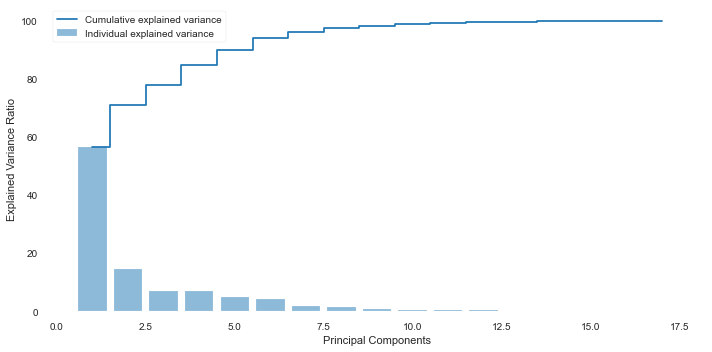

In [549]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, e_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, e_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

- We can observe there is significant drop in explained varaince with increasing number of principal components
- We are getting close to 95% (94.2%) with 6 Principal components. Beyond 11 components we can notice its providing very less increment in cumulative explained variance.
- We will be using & components as its closest value to 95% for our test with full data set.

In [550]:
# Reducing from 17 to 6 dimension space
pca = PCA(n_components=6)
data_reduced = pca.fit_transform(X_sd)
data_reduced.transpose()

array([[ 5.11694366e-01, -1.57560173e+00,  3.88304792e+00, ...,
         5.00182516e+00, -3.32902778e+00, -4.88984890e+00],
       [-6.65622078e-01, -1.75381691e-02, -1.29929586e-02, ...,
        -6.41009763e-02, -1.06470895e+00,  3.64479944e-01],
       [-7.86476706e-01,  8.55541706e-02, -1.09120320e+00, ...,
        -8.49919041e-01,  1.92850483e+00,  1.34018006e+00],
       [ 9.25483931e-01, -1.02486266e+00, -5.82383475e-01, ...,
         1.06973522e+00,  2.44236369e-01,  5.60557598e-02],
       [-1.17242553e+00, -6.75792768e-01,  3.10300502e-01, ...,
        -6.68320162e-01, -5.07496685e-01,  1.18492009e-02],
       [ 9.83146464e-01, -2.73193833e-03,  9.41913349e-01, ...,
        -7.99064620e-01, -3.50889935e-01, -4.38649950e-01]])

In [551]:
pca.components_

array([[ 0.27147643,  0.29145489,  0.30232419,  0.2651883 ,  0.0923183 ,
         0.18176894,  0.31345684, -0.3104644 ,  0.31042594,  0.28191865,
         0.30390716,  0.30983566,  0.26958116, -0.03127806,  0.04063824,
         0.05684174,  0.02624959],
       [-0.12387935,  0.14202753, -0.07553682, -0.2647602 , -0.32392235,
        -0.108337  ,  0.05979342,  0.01485639,  0.07574734,  0.13846611,
         0.05435859,  0.06765102,  0.23168243,  0.56783087, -0.04292674,
        -0.12057005, -0.58590889],
       [ 0.02014261, -0.20213311,  0.09440935, -0.04946881, -0.28330564,
        -0.13838953,  0.12143341, -0.08194338,  0.12685522, -0.19858267,
         0.11374688,  0.12501986, -0.21033945,  0.01647097, -0.36663157,
         0.74894425, -0.05055533],
       [-0.21664842, -0.00639285, -0.06817876,  0.25080133,  0.56054973,
        -0.04082053, -0.00829327, -0.05156365, -0.03140863, -0.04668605,
         0.08783162, -0.0151923 ,  0.01100517,  0.19675148, -0.69859154,
        -0.13828888

In [552]:
# Reducing from 17 to 6 dimension space
P_reduce = np.array(e_vecs[0:6])   
# projecting original data into principal component dimensions
X_std_6D = np.dot(X_sd,P_reduce.T)   
# converting array to dataframe for pairplot
Proj_data_df = pd.DataFrame(X_std_6D)

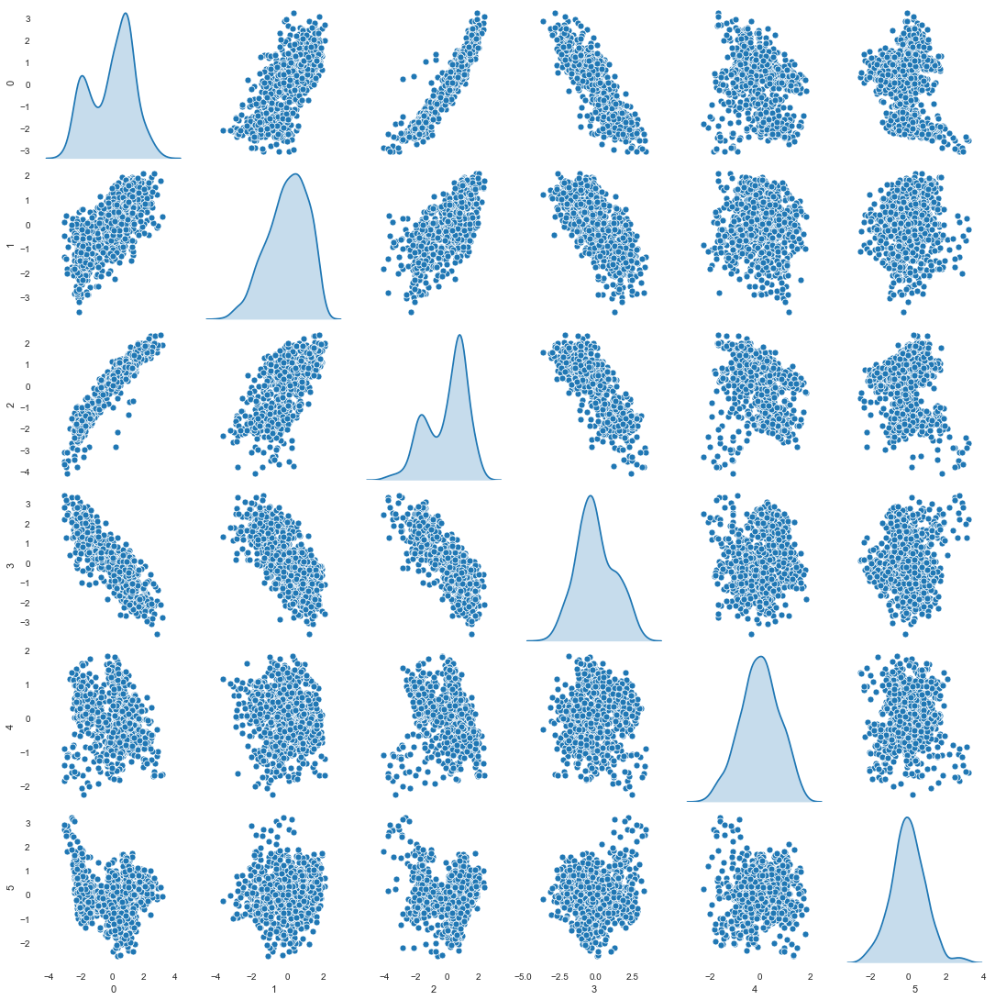

In [553]:
#Visualizing Data
sns.pairplot(Proj_data_df, diag_kind='kde')

- We can notice there are few columns which has high linear relation among themselves post implementing PCA, this might be possible because we have not removed or treated those cols which are mulitcollinear.
- Will attempt the same steps with reduced cols identified in earlier steps to observe if that reduces the multicoliniarity in data

In [554]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   circularity                  846 non-null    float64
 1   radius_ratio                 846 non-null    float64
 2   pr.axis_aspect_ratio         846 non-null    float64
 3   max.length_aspect_ratio      846 non-null    float64
 4   scatter_ratio                846 non-null    float64
 5   pr.axis_rectangularity       846 non-null    float64
 6   scaled_variance              846 non-null    float64
 7   scaled_variance.1            846 non-null    float64
 8   scaled_radius_of_gyration    846 non-null    float64
 9   scaled_radius_of_gyration.1  846 non-null    float64
 10  skewness_about               846 non-null    float64
 11  skewness_about.2             846 non-null    float64
 12  hollows_ratio                846 non-null    float64
 13  class               

In [555]:
df1.shape

(846, 14)

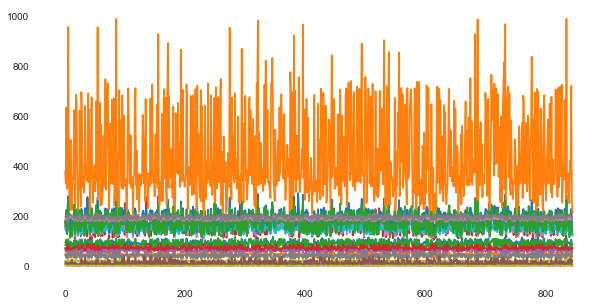

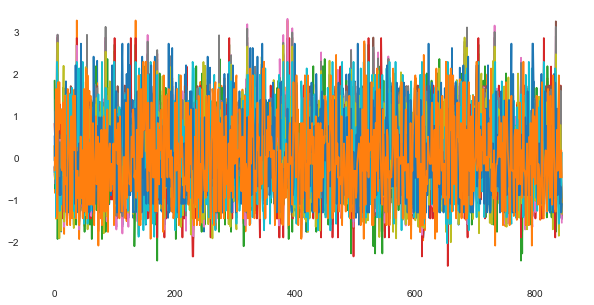

Covariance Matrix 
%s [[ 1.00118343  0.63155955  0.19810417  0.52459203  0.8489411   0.84439802
   0.80004452  0.83706327  0.92691166  0.05654873  0.14472306 -0.10455005]
 [ 0.63155955  1.00118343  0.68167801  0.49825704  0.75117576  0.72497311
   0.79545777  0.73569109  0.54550889 -0.32844688  0.04925773  0.39225435]
 [ 0.19810417  0.68167801  1.00118343  0.23065416  0.17340574  0.14281208
   0.23964053  0.15748235  0.14864321 -0.24695645 -0.05714385  0.36896913]
 [ 0.52459203  0.49825704  0.23065416  1.00118343  0.44013245  0.43549506
   0.41597468  0.39927899  0.3747014  -0.25741705  0.08468231  0.05551619]
 [ 0.8489411   0.75117576  0.17340574  0.44013245  1.00118343  0.99092181
   0.95400927  0.99426043  0.80082111 -0.01258426  0.074074    0.00563439]
 [ 0.84439802  0.72497311  0.14281208  0.43549506  0.99092181  1.00118343
   0.93970351  0.98937889  0.79763248  0.00354578  0.08329612 -0.01867064]
 [ 0.80004452  0.79545777  0.23964053  0.41597468  0.95400927  0.93970351
   1.00118

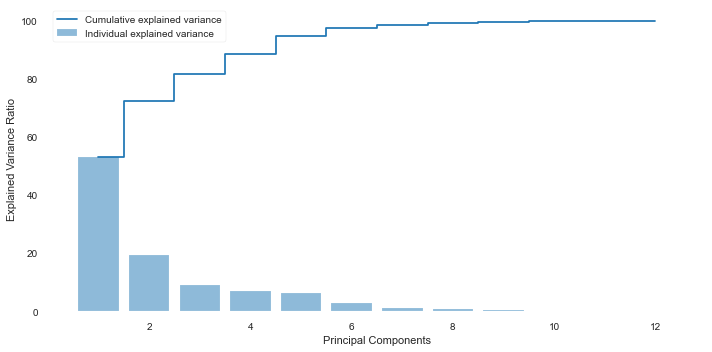

In [556]:
#Applying PCA on reduced data set - with removal of selective columns
X = df1.iloc[:,0:12].values
y = df1.iloc[:,13].values

# Scaling the independent attributes using zscore
X_sd = StandardScaler().fit_transform(X)




# prior to scaling
plt.rcParams['figure.figsize']=(10,5)
plt.plot(df)
plt.show()

plt.rcParams['figure.figsize']=(10,5)
plt.plot(X_sd)
plt.show()

# generating the covariance matrix and the eigen values for the PCA analysis
cov_matrix = np.cov(X_sd.T) # the relevanat covariance matrix
print('Covariance Matrix \n%s', cov_matrix)

#generating the eigen values and the eigen vectors
e_vals, e_vecs = np.linalg.eig(cov_matrix)
print('Eigenvectors \n%s' %e_vecs)
print('\nEigenvalues \n%s' %e_vals)

# the "cumulative variance explained" analysis 
tot = sum(e_vals)
var_exp = [( i /tot ) * 100 for i in sorted(e_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)



# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, e_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, e_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()


- We can observe with reduced columns we are able to capture close to 95% covariance at 5 components it self (94.84%).
- With 5 components we are covering close to 95% (94.84%)
- We will take 5 components for our further analysis as its the closest value to 95% for our test.

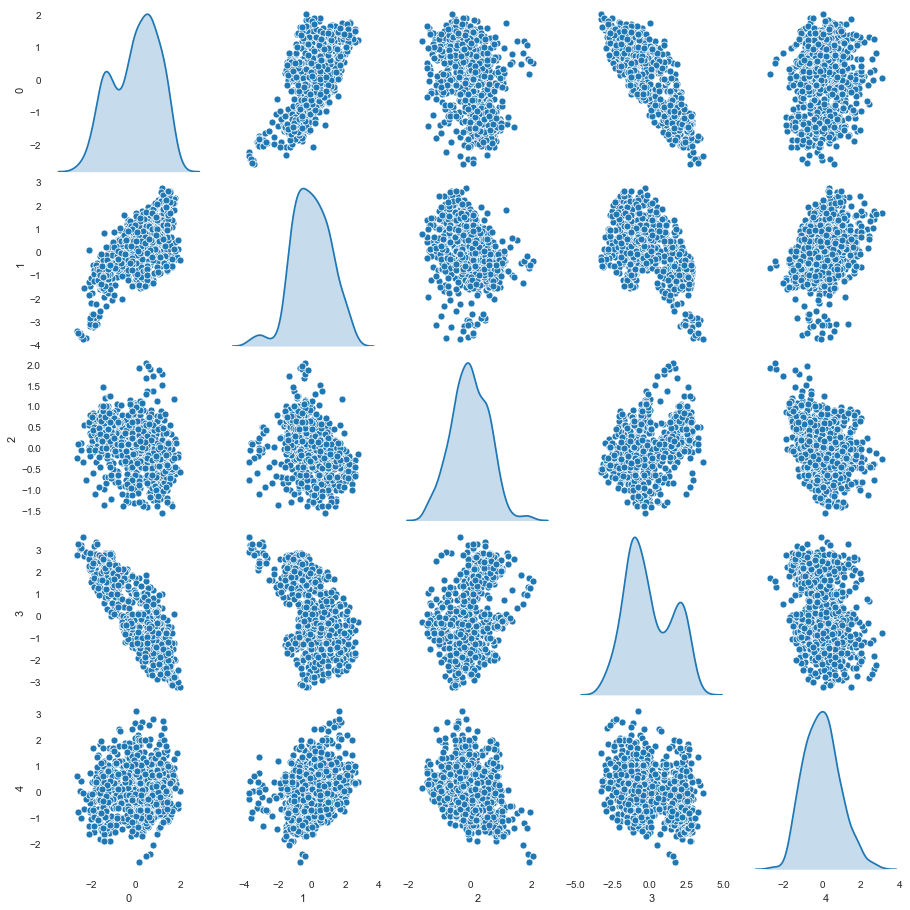

In [557]:


# Reducing from 14 to 5 dimension space
pca = PCA(n_components=5)
data_reduced = pca.fit_transform(X_sd)
data_reduced.transpose()

pca.components_

# Reducing from 17 to 6 dimension space
P_reduce = np.array(e_vecs[0:5])   
# projecting original data into principal component dimensions
X_std_5D = np.dot(X_sd,P_reduce.T)   
# converting array to dataframe for pairplot
Proj_data_df1 = pd.DataFrame(X_std_5D)

#Visualizing Data
sns.pairplot(Proj_data_df1, diag_kind='kde')

- We can notice the llinear correlation is very much reduced among the columns compared to PCA details we recived from previous steps.
- We can still observe linear relation but the lines are not very thin but a more wider and cloud like shape.

In [558]:
#using PCA columns for model evaluation - df - all columns

#splitting the data in test and train sets
X_train, X_test, y_train, y_test = train_test_split(Proj_data_df,y, test_size = 0.2, random_state = 10)

# scaling the data using the standard scaler
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

#Support vector Classifier

model = SVC(kernel='linear')

model.fit(X_train_sd, y_train)
prediction = model.predict(X_test_sd)

# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train_sd, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test_sd , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.7736686390532544
Accuracy on Testing data:  0.7176470588235294
Recall value:  0.7168281662663686
Precision value:  0.691684466524268
Confusion Matrix:
 [[28 11  4]
 [ 7 65  4]
 [ 9 13 29]]
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.65      0.64        43
           1       0.73      0.86      0.79        76
           2       0.78      0.57      0.66        51

    accuracy                           0.72       170
   macro avg       0.72      0.69      0.70       170
weighted avg       0.72      0.72      0.71       170



- We can notice the Train and Test accuracies are above 70%. There is a slight variation amon train and test accuracies but its acceptable range.
- Recall and Precission value are close by and are around 70%

In [559]:

kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
#kfold = KFold(n_splits=num_folds)
model1 = SVC(kernel='linear')
results = cross_val_score(model1, X_train_sd, y_train, cv=kfold)
print(results)
print("\n Average model Accuracy: %.3f%% with std. dev - (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

modelComp=modelComp.append(pd.DataFrame({'Model':['PCA - SVC - All Cols'],
                                         'Accuracy':[model.score(X_test_sd , y_test)],
                                         'Precission':[metrics.precision_score(y_test, prediction, average='macro')],
                                         'Recall':[metrics.recall_score(y_test, prediction, average='macro')],
                                         'Kfold-Mean-Accuracy':[results.mean()],
                                         'Kfold-StdDeviation':[results.std()]}))

[0.85714286 0.71428571 0.71428571 0.92857143 0.85714286 0.57142857
 0.64285714 0.64285714 0.85714286 0.71428571 0.85714286 0.78571429
 1.         0.71428571 0.64285714 0.78571429 0.85714286 0.92857143
 0.85714286 0.64285714 0.85714286 0.57142857 0.64285714 0.35714286
 0.64285714 0.78571429 0.84615385 0.69230769 0.61538462 0.84615385
 0.84615385 0.69230769 0.92307692 0.92307692 0.76923077 0.76923077
 0.92307692 0.76923077 0.84615385 0.61538462 0.61538462 0.84615385
 0.92307692 0.92307692 0.84615385 0.76923077 0.76923077 0.69230769
 0.76923077 0.69230769]

 Average model Accuracy: 76.703% with std. dev - (12.355%)


- We can notice with PCA the model is producing wide range of results
- Min being 61.5% and Max as 1
- We can notice the std. dev. is quite high around 12.4%, which effectively puts the results to be in range from 64.35% to 89.6%.

In [560]:
#using PCA columns for model evaluation - df1 - selective columns

#splitting the data in test and train sets
X_train, X_test, y_train, y_test = train_test_split(Proj_data_df1,y, test_size = 0.2, random_state = 10)

# scaling the data using the standard scaler
X_train_sd = StandardScaler().fit_transform(X_train)
X_test_sd = StandardScaler().fit_transform(X_test)

#Support vector Classifier

model = SVC(kernel='linear')

model.fit(X_train_sd, y_train)
prediction = model.predict(X_test_sd)

# check the accuracy on the training data
print('Accuracy on Training data: ',model.score(X_train_sd, y_train))
# check the accuracy on the testing data
print('Accuracy on Testing data: ', model.score(X_test_sd , y_test))
#Calculate the recall value 
print('Recall value: ',metrics.recall_score(y_test, prediction, average='macro'))
#Calculate the precision value 
print('Precision value: ',metrics.precision_score(y_test, prediction, average='macro'))
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))
print("Classification Report:\n",metrics.classification_report(prediction,y_test))

Accuracy on Training data:  0.7751479289940828
Accuracy on Testing data:  0.7411764705882353
Recall value:  0.7284736217320487
Precision value:  0.7205459484529252
Confusion Matrix:
 [[34  8  3]
 [ 8 68 10]
 [ 2 13 24]]
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.76      0.76        45
           1       0.76      0.79      0.78        86
           2       0.65      0.62      0.63        39

    accuracy                           0.74       170
   macro avg       0.73      0.72      0.72       170
weighted avg       0.74      0.74      0.74       170



- We can see the traina nd test accuracies are close by and around 75%
- Recall and Precision values are also around 72%.

In [561]:

kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
#kfold = KFold(n_splits=num_folds)
model1 = SVC(kernel='linear')
results = cross_val_score(model1, X_train_sd, y_train, cv=kfold)
print(results)
print("\n Average model Accuracy: %.3f%% with std. dev - (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

modelComp=modelComp.append(pd.DataFrame({'Model':['PCA - SVC-Selective Cols-13'],
                                         'Accuracy':[model.score(X_test_sd , y_test)],
                                         'Precission':[metrics.precision_score(y_test, prediction, average='macro')],
                                         'Recall':[metrics.recall_score(y_test, prediction, average='macro')],
                                         'Kfold-Mean-Accuracy':[results.mean()],
                                         'Kfold-StdDeviation':[results.std()]}))

[0.85714286 0.71428571 0.71428571 0.78571429 0.78571429 0.64285714
 0.78571429 0.78571429 0.71428571 0.5        0.85714286 0.71428571
 0.85714286 0.71428571 0.5        0.85714286 0.85714286 0.85714286
 0.92857143 0.78571429 0.64285714 0.71428571 0.71428571 0.71428571
 0.64285714 0.64285714 0.84615385 0.92307692 0.69230769 0.76923077
 0.69230769 0.61538462 0.92307692 0.84615385 0.69230769 0.76923077
 0.76923077 0.84615385 0.92307692 0.76923077 0.69230769 0.92307692
 0.84615385 0.92307692 0.92307692 0.84615385 0.61538462 0.76923077
 0.69230769 0.76923077]

 Average model Accuracy: 76.725% with std. dev - (10.530%)


- Average model accuracy is 76.7% with std. dev. of 10.5%. This effectively puts the rang of values to 66.2% to 87.2%.
- We can observe few values, as low as 0.5 and high till 92%

### Model Comparisons

In [562]:
modelComp

,Model,Accuracy,Precission,Recall,Kfold-Mean-Accuracy,Kfold-StdDeviation
0,SVC-All Cols,0.941176,0.924358,0.939095,0.933846,0.070063
0,SVC-Selective Cols-13,0.911765,0.891265,0.921802,0.921868,0.076160
0,SVC-Selective Cols-14,0.941176,0.926569,0.949622,0.929231,0.077374
0,PCA - SVC - All Cols,0.717647,0.691684,0.716828,0.767033,0.123547
0,PCA - SVC-Selective Cols-13,0.741176,0.720546,0.728474,0.767253,0.105304


- Comparing the above model based on their Accuracy, Precission, Recall, Cross-Validation Score from Kfold-Mean-Accuracy and Kfold-mean-StdDeviation
- K-fold Cross validation is implemeted only on training data set to avoid any kind of data leak by exposing test set
- From PCA, we have captured number of components based on the variance required for our thes which is 95%.
- We can observe that post using PCA we are still able to get test accuracy and k-fold mean accuracy above 70% even after capturing only 95% of the variance present in the data.
- When we computed the model with all cols, we have got better results before PCA but the model is hugely complex as its using all 18 cols/dimensions.
- When we computed same with PCA we can notice the models test accuracy is 71.7% & kfold mean accuracy is 76%.
- While using PCA for dataset with selective columns we can notice models test Accuracy is 74.1% but kfold mean accuracy is 76.7%.
- With PCA implemented, even after covering only 95% of the variance on the data its able to acheive 74.1% accuracy in test data and 76.7% accuracy in k-fold mean accuracy. We can observe the mean standard deviation for k-fold is around 10.5%, which gives us a range of 66%-87% accuracy on data sets.
- We can notice in the K-fold details the accuracies were as high as 92% as well, but very few occurances when it goes to low of 50% as well.
- PCA is able to preserve the original data sets and could have produced much better results if we have choosen higher percentage of variance like 97% or 99%.